In [ ]:
# !pip install torchsummary
!pip install split-folders

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
#import splitfolders
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from google.colab import drive

from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.tensorboard import SummaryWriter

%matplotlib inline

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DATASET_DIR = "/content/drive/MyDrive/AAI_Dataset/PlantVillage"

In [ ]:
#Split folder into train, test and validation set.
#splitfolders.ratio('/content/drive/MyDrive/AAI_Dataset/PlantVillage', output="/content/drive/MyDrive/AAI_Dataset/PlantVillage", seed=1337, ratio=(.8, .1, .1))

Copying files: 25414 files [16:08, 26.24 files/s]


In [ ]:
train_dir = DATASET_DIR + "/train"
valid_dir = DATASET_DIR + "/val"
test_dir = DATASET_DIR + "/test"
diseases = os.listdir(train_dir)

# Print diseases name
print(diseases)

['Tomato___Spider_mites Two-spotted_spider_mite', 'Soybean___healthy', 'Strawberry___Leaf_scorch', 'Potato___Late_blight', 'Raspberry___healthy', 'Squash___Powdery_mildew', 'Tomato___Septoria_leaf_spot', 'Peach___Bacterial_spot', 'Tomato___Tomato_mosaic_virus', 'Pepper,_bell___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Northern_Leaf_Blight', 'Orange___Haunglongbing_(Citrus_greening)']


In [ ]:
print(f"Total classes are: {len(diseases)}")

Total classes are: 15


In [ ]:
# Count the number of unique plants and disease
plants = set()
conditions = set()

number_of_diseases = 0

for plant in diseases:
    plant_name, condition = plant.split('___')
    conditions.add(condition)
    plant_name = plant_name.replace('_', ' ').replace(', ', ' ').title()
    plants.add(plant_name)
    if condition != 'healthy':
        number_of_diseases += 1

plants = list(plants)
conditions =list(conditions)

In [ ]:
# Unique plants
print(f"Number of unique plants are: \n{plants}")

Number of unique plants are: 
['Strawberry', 'Tomato', 'Soybean', 'Peach', 'Squash', 'Raspberry', 'Pepper Bell', 'Cherry (Including Sour)', 'Orange', 'Grape', 'Potato', 'Corn (Maize)', 'Apple']


In [ ]:
# Unique plants count
print(f"Number of unique plants: {len(plants)}")

Number of unique plants: 13


In [ ]:
# Unique unique disease count
print(f"Number of unique disease: {number_of_diseases}")
print(conditions)

Number of unique disease: 13
['Septoria_leaf_spot', 'Northern_Leaf_Blight', 'Tomato_mosaic_virus', 'Powdery_mildew', 'healthy', 'Spider_mites Two-spotted_spider_mite', 'Bacterial_spot', 'Cedar_apple_rust', 'Haunglongbing_(Citrus_greening)', 'Leaf_blight_(Isariopsis_Leaf_Spot)', 'Late_blight', 'Leaf_scorch']


In [ ]:
nums = {disease: len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases}

# Converting the nums dictionary to pandas DataFrame with plant name as index and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["No. of images"])

img_per_class

,No. of images
Tomato___Spider_mites Two-spotted_spider_mite,1340
Soybean___healthy,4072
Strawberry___Leaf_scorch,887
Potato___Late_blight,800
Raspberry___healthy,296
Squash___Powdery_mildew,1468
Tomato___Septoria_leaf_spot,1416
Peach___Bacterial_spot,1837
Tomato___Tomato_mosaic_virus,298
"Pepper,_bell___Bacterial_spot",797


<Figure size 1000x600 with 0 Axes>

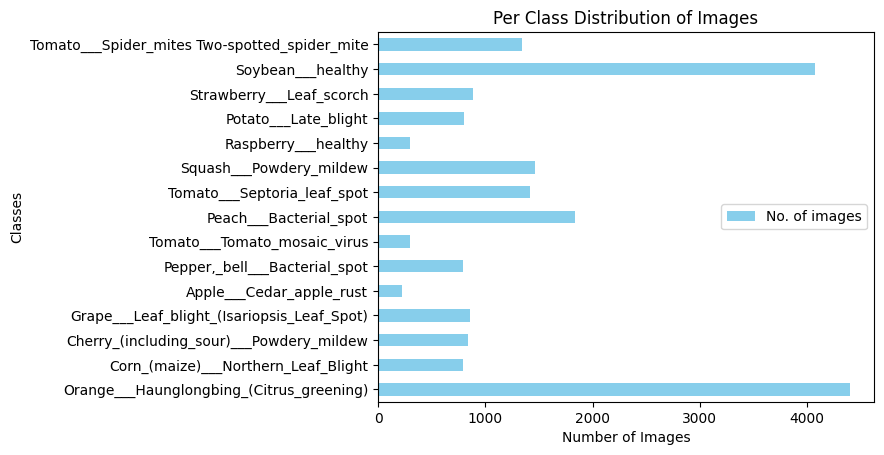

In [ ]:
plt.figure(figsize=(10, 6))
img_per_class.plot(kind='barh', color='skyblue')
plt.xlabel('Number of Images')
plt.ylabel('Classes')
plt.title('Per Class Distribution of Images')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.8, 1.2)),
    transforms.RandomPerspective(distortion_scale=0.1),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


def is_valid_file(file_path):
    try:
        # Open the image file
        with open(file_path, 'rb') as f:
            img = Image.open(f)

            # Attempt to load the image to ensure it's valid
            img.load()
             # Verify the integrity of the image file
            img.verify()
            return True
    except Exception as e:
        # If any exception occurs during the process, consider the file as invalid
        return False

batch_size=32



In [ ]:
train_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/PlantVillage/train', transform=train_transforms,is_valid_file=is_valid_file)
val_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/PlantVillage/val', transform=val_transforms,is_valid_file=is_valid_file)
test_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/PlantVillage/test', transform=val_transforms,is_valid_file=is_valid_file)

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

In [ ]:
import torchvision.models as models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Device: {device}')
model = models.vgg19(pretrained=True)
model.to(device)


Device: cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 195MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


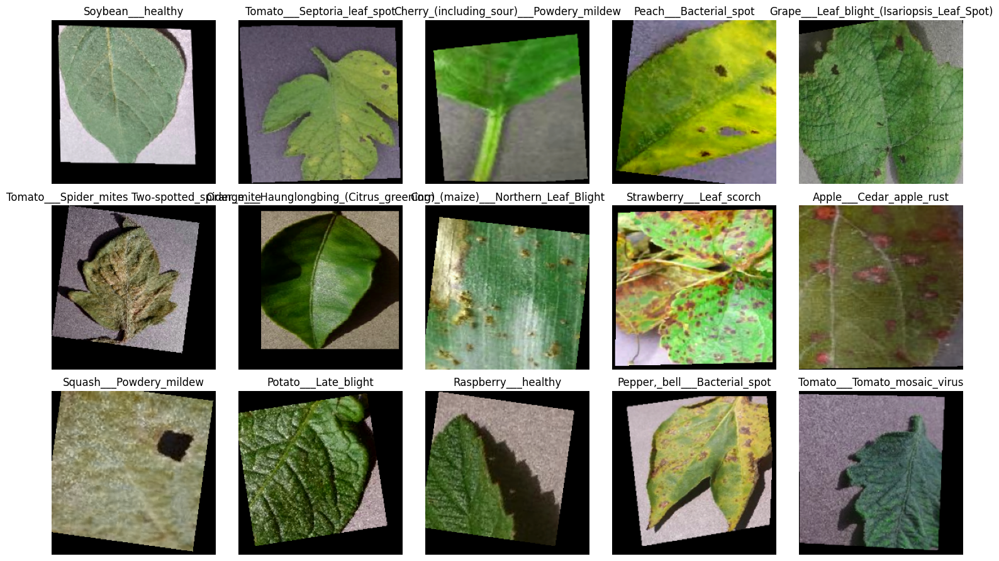

In [ ]:
unique_classes = set()
class_to_idx = train_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

num_classes = len(class_to_idx)
num_rows = math.ceil(num_classes/5)
num_cols = min(5, num_classes)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3))

row_index = 0
col_index = 0

for images, labels in train_loader:
    for image, label in zip(images, labels):
        class_name = idx_to_class[label.item()]
        if class_name not in unique_classes:
            unique_classes.add(class_name)
            ax = axes[row_index, col_index]
            img = image.numpy().transpose((1, 2, 0))
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img = std * img + mean
            img = np.clip(img, 0, 1)

            ax.imshow(img)
            ax.set_title(class_name)
            ax.axis('off')

            col_index += 1
            if col_index == num_cols:
                col_index = 0
                row_index += 1

        if len(unique_classes) == num_classes:
            break
    if len(unique_classes) == num_classes:
        break

plt.tight_layout()
plt.show()

In [ ]:
class_names = {
    0: 'Apple___Cedar_apple_rust',
    1: 'Cherry_(including_sour)___Powdery_mildew',
    2: 'Corn_(maize)___Northern_Leaf_Blight',
    3: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    4: 'Orange___Haunglongbing_(Citrus_greening)',
    5: 'Peach___Bacterial_spot',
    6: 'Pepper,_bell___Bacterial_spot',
    7: 'Potato___Late_blight',
    8: 'Raspberry___healthy',
    9: 'Soybean___healthy',
    10: 'Squash___Powdery_mildew',
    11: 'Strawberry___Leaf_scorch',
    12: 'Tomato___Septoria_leaf_spot',
    13: 'Tomato___Tomato_mosaic_virus',
    14: 'Tomato___Spider_mites Two-spotted_spider_mite'
}



In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, weight_decay=1e-5, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, verbose=True)


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [ ]:
TENSORBOARD_SUMMARY_PATH=f'{DATASET_DIR}/PlantVillage_Images'
writer = SummaryWriter(TENSORBOARD_SUMMARY_PATH)

In [ ]:
BEST_MODEL_PATH='/content/drive/MyDrive/PlantVillage_Imagess.pth'

In [ ]:
early_stopping_patience = 5
epochs_no_improve = 0
val_loss_min = np.Inf

In [ ]:
def train_model(num_epochs):
    global epochs_no_improve
    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        # Train the model
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / total
        epoch_acc = correct / total
        writer.add_scalar('Training loss', epoch_loss, epoch)
        writer.add_scalar('Training accuracy', epoch_acc, epoch)

        # Validation
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss = val_running_loss / val_total
        val_accuracy = val_correct / val_total
        writer.add_scalar('Validation loss', val_loss, epoch)
        writer.add_scalar('Validation accuracy', val_accuracy, epoch)

        scheduler.step(val_loss)

        print(f'Epoch [{epoch+1}/{num_epochs}], '
              f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, '
              f'Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), BEST_MODEL_PATH)
        else:
            epochs_no_improve += 1

        if epochs_no_improve == early_stopping_patience:
            print('Early stopping initiated...')
            break

In [ ]:
import torch.nn as nn

# finallayer of neural network model
final_layer = None

# Iterate over the layers of the model to find the final layer
for layer in model.modules():
    if isinstance(layer, nn.Linear) or isinstance(layer, nn.Conv2d):
        final_layer = layer

# Print the number of output units in the final layer
if final_layer is not None:
    num_output_units = final_layer.out_features
    print("nodes in the output layer of a neural network:", num_output_units)
else:
    print("Layer not found, recheck the architecure")


nodes in the output layer of a neural network: 1000


In [ ]:
import pandas as pd
from torch.utils.tensorboard import SummaryWriter

In [ ]:
num_epochs = 10
train_model(num_epochs)

Epoch [1/10], Train Loss: 0.8952, Train Acc: 0.7446, Val Loss: 0.2583, Val Acc: 0.9132
Epoch [2/10], Train Loss: 0.3096, Train Acc: 0.9042, Val Loss: 0.1004, Val Acc: 0.9736
Epoch [3/10], Train Loss: 0.2167, Train Acc: 0.9340, Val Loss: 0.0487, Val Acc: 0.9866
Epoch [4/10], Train Loss: 0.1670, Train Acc: 0.9483, Val Loss: 0.0323, Val Acc: 0.9917
Epoch [5/10], Train Loss: 0.1506, Train Acc: 0.9526, Val Loss: 0.0192, Val Acc: 0.9941
Epoch [6/10], Train Loss: 0.1412, Train Acc: 0.9569, Val Loss: 0.0302, Val Acc: 0.9921
Epoch [7/10], Train Loss: 0.1216, Train Acc: 0.9629, Val Loss: 0.0185, Val Acc: 0.9949
Epoch [8/10], Train Loss: 0.1111, Train Acc: 0.9638, Val Loss: 0.0081, Val Acc: 0.9972
Epoch [9/10], Train Loss: 0.1080, Train Acc: 0.9672, Val Loss: 0.0162, Val Acc: 0.9925
Epoch [10/10], Train Loss: 0.1009, Train Acc: 0.9688, Val Loss: 0.0140, Val Acc: 0.9953


In [ ]:
# Model evaluation
model.load_state_dict(torch.load(BEST_MODEL_PATH))
model.eval()
test_correct = 0
test_total = 0
all_targets = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_targets.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

test_accuracy = test_correct / test_total
print(f'\n\nTest Accuracy: {test_accuracy:.4f}')

writer.close()



Test Accuracy: 0.9984


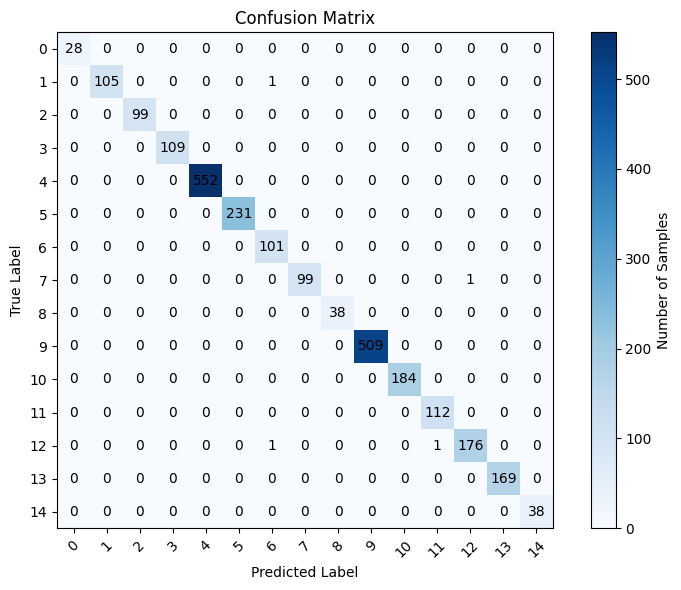

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      0.99      1.00       106
           2       1.00      1.00      1.00        99
           3       1.00      1.00      1.00       109
           4       1.00      1.00      1.00       552
           5       1.00      1.00      1.00       231
           6       0.98      1.00      0.99       101
           7       1.00      0.99      0.99       100
           8       1.00      1.00      1.00        38
           9       1.00      1.00      1.00       509
          10       1.00      1.00      1.00       184
          11       0.99      1.00      1.00       112
          12       0.99      0.99      0.99       178
          13       1.00      1.00      1.00       169
          14       1.00      1.00      1.00        38

    accuracy                           1.00      2554
   macro avg       1.00      1.00      1.00      2554
wei

In [ ]:
conf_matrix = confusion_matrix(all_targets, all_predictions)

plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, cmap='Blues', interpolation='nearest')

for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, str(conf_matrix[i, j]), horizontalalignment='center', verticalalignment='center')

plt.title('Confusion Matrix')
plt.colorbar(label='Number of Samples')
plt.xticks(np.arange(len(conf_matrix)), list(set(all_targets)), rotation=45)
plt.yticks(np.arange(len(conf_matrix)), list(set(all_targets)))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()

class_report = classification_report(all_targets, all_predictions)
print("Classification Report:")
print(class_report)

In [ ]:
%load_ext tensorboard
%tensorboard
%tensorboard --logdir {TENSORBOARD_SUMMARY_PATH}

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2024-04-10 04:13:32.579441: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-10 04:13:32.579507: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-10 04:13:32.580864: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-10 04:13:33.524601: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Error: A logdir or db must be specified. For example `tensorboard --logdir mylogdir` or `tensorboard --db sqlite:~/.tensorboard.db`. Run `tensorboard --helpfull` for de

<IPython.core.display.Javascript object>

In [ ]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

# Create an EventAccumulator object for the SummaryWriter's log directory
event_acc = EventAccumulator(TENSORBOARD_SUMMARY_PATH)
event_acc.Reload()

# Get training and validation scalars
train_loss = [event.value for event in event_acc.Scalars('Training loss')]
train_accuracy = [event.value for event in event_acc.Scalars('Training accuracy')]
val_loss = [event.value for event in event_acc.Scalars('Validation loss')]
val_accuracy = [event.value for event in event_acc.Scalars('Validation accuracy')]

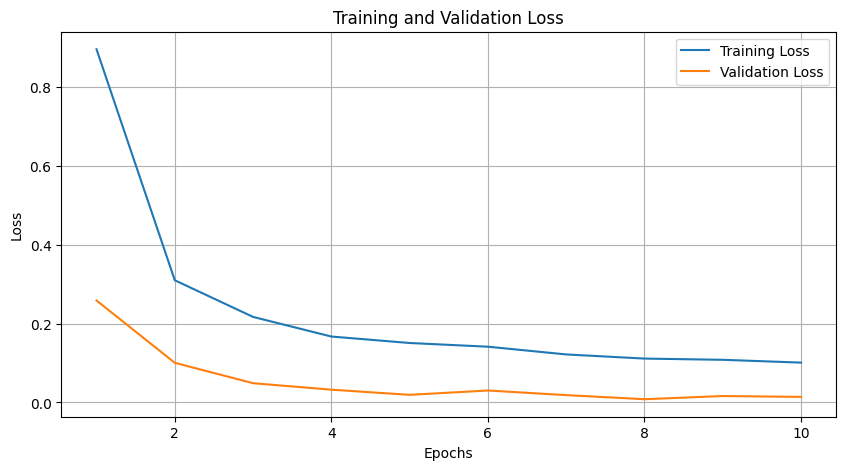

In [1]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(train_loss) + 1), y=train_loss, label='Training Loss')
sns.lineplot(x=range(1, len(val_loss) + 1), y=val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

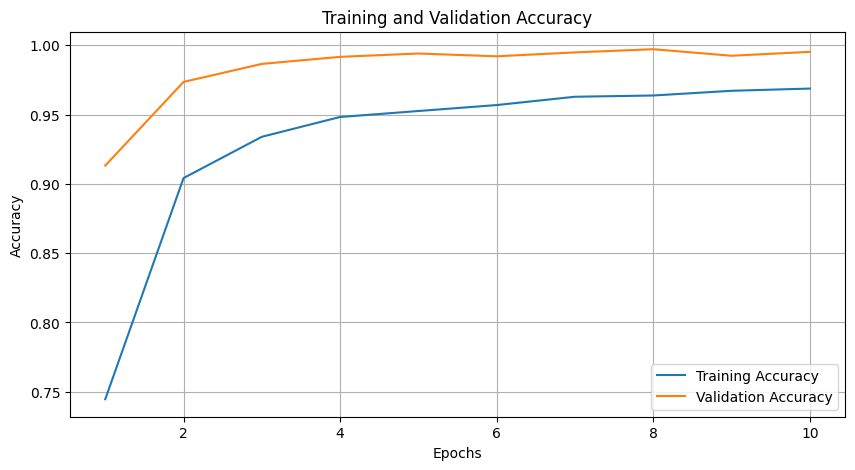

In [2]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(train_accuracy) + 1), y=train_accuracy, label='Training Accuracy')
sns.lineplot(x=range(1, len(val_accuracy) + 1), y=val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
def extract_features(loader, model, device):
    features = []
    targets = []
    model.eval()
    outputs = None
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            features.extend(outputs.cpu().numpy())
            targets.extend(labels.cpu().numpy())
    return np.array(features), np.array(targets)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


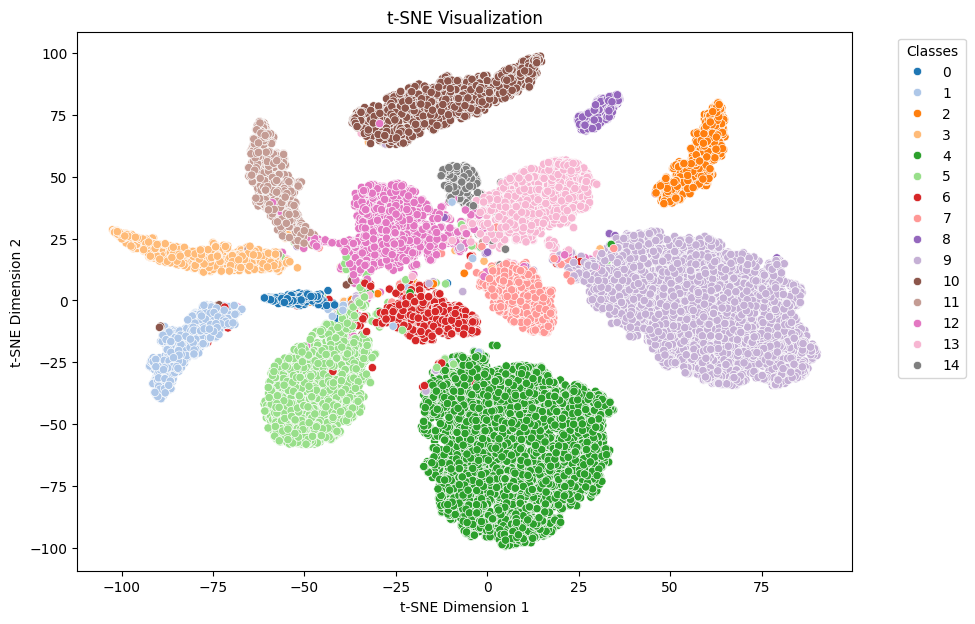

In [ ]:
from sklearn.manifold import TSNE
train_features, train_targets = extract_features(train_loader, model, device)
val_features, val_targets = extract_features(val_loader, model, device)

all_features = np.concatenate((train_features, val_features), axis=0)
all_targets = np.concatenate((train_targets, val_targets), axis=0)

tsne = TSNE(n_components=2, random_state=42)
tsne_features = tsne.fit_transform(all_features)


plt.figure(figsize=(10, 7))
sns.scatterplot(x=tsne_features[:, 0], y=tsne_features[:, 1], hue=all_targets, palette='tab20', legend='full')
plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()